In [2]:
import matplotlib.pyplot as plt
import numpy as np

In [3]:
# Functions for sierpinski triangle

def area(p1, p2, p3):
    return abs((p1[0] * (p2[1] - p3[1])) +
               (p2[0] * (p3[1] - p1[1])) +
               (p3[0] * (p1[1] - p2[1]))) / 2


def is_triangle(p1, p2, p3):
    a = np.sqrt(((p3[0] - p2[0])**2) + (p3[1] - p2[1])**2)
    b = np.sqrt(((p3[0] - p1[0])**2) + (p3[1] - p1[1])**2)
    c = np.sqrt(((p1[0] - p2[0])**2) + (p1[1] - p2[1])**2)
    return True if max(a, b, c) < a + b + c - max(a, b, c) else False


def in_triangle(t, p):
    p1 = t['p1']
    p2 = t['p2']
    p3 = t['p3']

    return True if area(p1, p2, p) + area(p1, p3, p) + \
        area(p2, p3, p) == area(p1, p2, p3) else False


def mid_point(p1, p2):
    return ((p1[0] + p2[0]) / 2, (p1[1] + p2[1]) / 2)


def print_chaos(t, n=100):
    threshold = max(
        t['p1'][0],
        t['p2'][0],
        t['p3'][0],
        t['p1'][1],
        t['p2'][1],
        t['p3'][1])
    t_points = ['p1', 'p2', 'p3']
    x_arr = []
    y_arr = []
    count = 0
    point = (np.random.rand() * threshold, np.random.rand() * threshold)
    while not in_triangle(t, point):
        point = (np.random.rand() * threshold, np.random.rand() * threshold)
    for i in range(n):
        mid = mid_point(point, t[np.random.choice(t_points)])
        x_arr.append(mid[0])
        y_arr.append(mid[1])
        point = mid

    fig, ax = plt.subplots(figsize=(15, 10), dpi=600)
    ax.scatter(x_arr, y_arr, s=0.1)
    ax.scatter([t['p1'][0], t['p2'][0], t['p3'][0]], [
               t['p1'][1], t['p2'][1], t['p3'][1]], color='red')


In [26]:
# Functions for chaos leaf
def new_point(point: tuple):
    rand = np.random.randint(0, 101)

    if rand == 1:
        return (0, 0.16 * point[1])

    elif rand > 1 and rand <= 86:
        return ((0.85 * point[0]) + (0.05 * point[1]),
                (-0.05 * point[0]) + (0.85 * point[1]) + 1.6)

    elif rand > 86 and rand <= 93:
        return ((0.2 * point[0]) - (0.26 * point[1]),
                (0.23 * point[0]) + (0.22 * point[1]) + 1.6)

    else:
        return ((-0.15 * point[0]) + (0.28 * point[1]) - 0.028,
                (0.26 * point[0]) + (0.24 * point[1]) + 1.05)


def draw_leaf(iterations):
    point = (0, 0)
    x_arr = [0]
    y_arr = [0]
    for i in range(iterations):
        point = new_point(point)
        x_arr.append(point[0])
        y_arr.append(point[1])

    fig, ax = plt.subplots(figsize=(15, 10), dpi=600)
    ax.scatter(x_arr, y_arr, s=0.1, color='green')


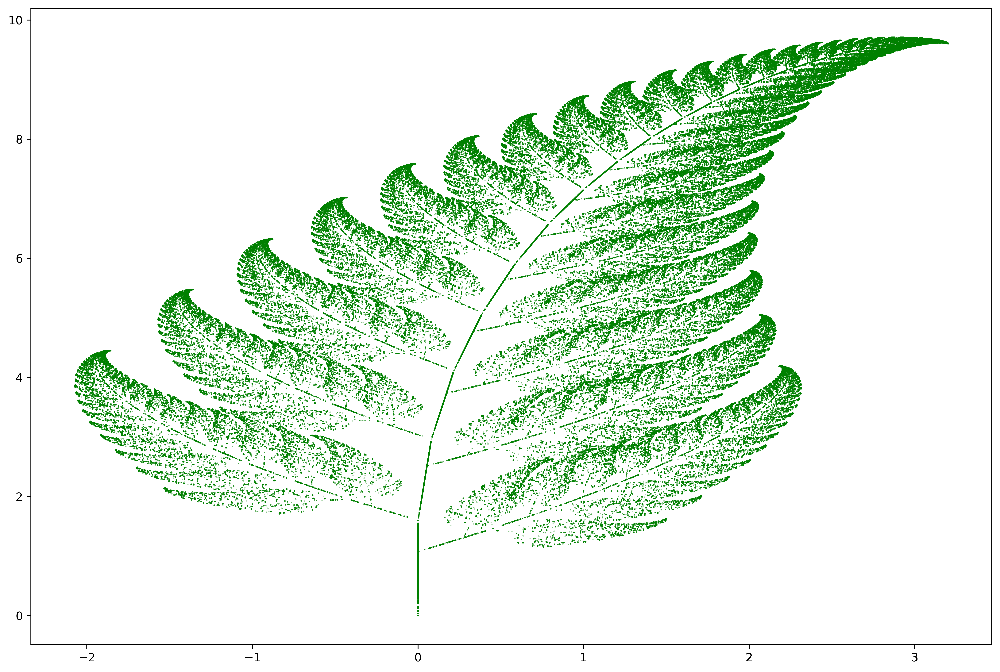

In [30]:
draw_leaf(100000)

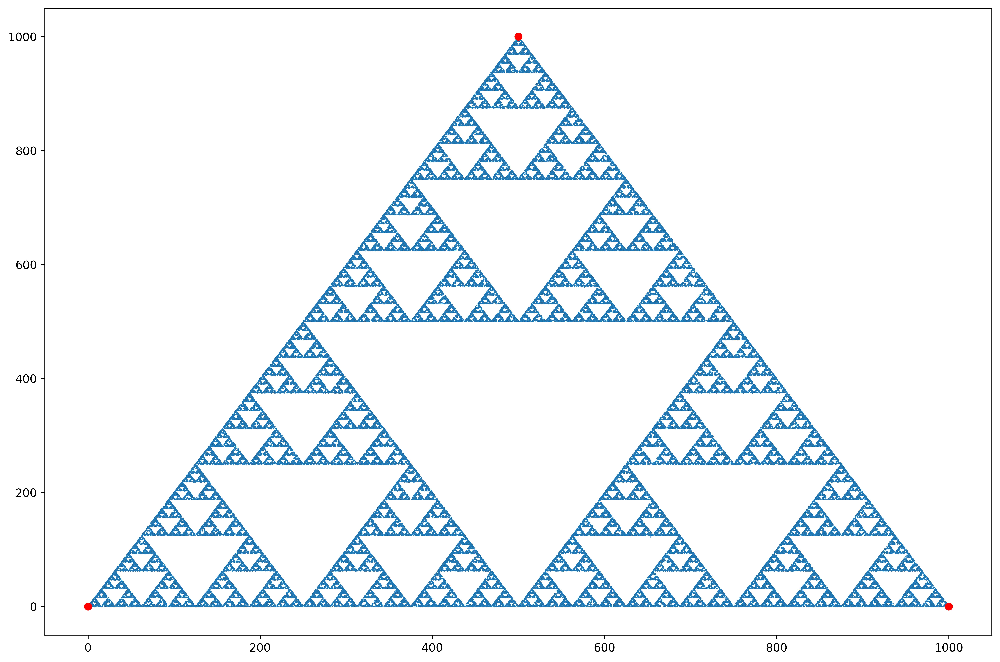

In [31]:
# edit this cell...

# triangle points
p1 = (0, 0)
p2 = (1000, 0)
p3 = (500, 1000)

t = {
    'p1': p1,
    'p2': p2,
    'p3': p3
}

print_chaos(t, 100000)
